# Bounce Analysis - Tennis Ball Part 2

## Development Objective of this notebook

Make a system that can actually identify in which frames of the video a bounce is occuring, then, in another future step, get the locations of this bounce by rectifying the tennis court

In [1]:
# Mounting the drive position to use GPU

from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Polimi/IACV/tennis-tracker/tennis-ball-tracker-computer-vision/

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/Polimi/IACV/tennis-tracker/tennis-ball-tracker-computer-vision


In [2]:
# importing data and libraries

frames_qt = 448
import pickle

# Load the saved coordinates
with open('ball_coords_no_court_83.pkl', 'rb') as f:
    q = pickle.load(f)
len(q)

447

In [3]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

from scipy.interpolate import interp1d
import cv2

In [9]:
valid_coords = [q[i] for i in range(len(q)) if q[i] is not None]

x_coords = np.array([valid_coords[i][0] for i in range(len(valid_coords))])
y_coords = np.array([valid_coords[i][1] for i in range(len(valid_coords))])
total_frames_identified = len(valid_coords)

In [5]:
total_frames_identified-frames_qt

-75

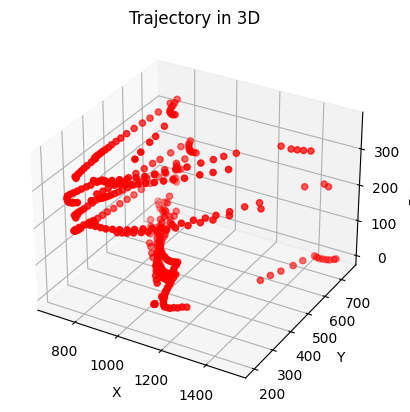

In [39]:
x = np.array(x_coords)
y = np.array(y_coords)
frame_numbers = np.arange(len(x))

# Plotting
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, frame_numbers, c='r', marker='o')
# Labeling axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Frame')

plt.title('Trajectory in 3D')
plt.show()

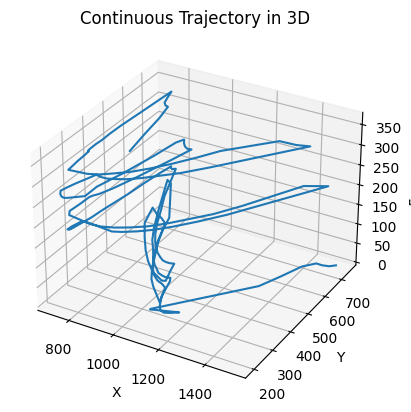

In [40]:
# Skipping frames by a factor (e.g., 2)
skip_factor = 2

# Interpolate the trajectory points with skipping frames
f_x = interp1d(frame_numbers[::skip_factor], x[::skip_factor], kind='linear', bounds_error=False)
f_y = interp1d(frame_numbers[::skip_factor], y[::skip_factor], kind='linear', bounds_error=False)

# Calculate interpolated values for x and y coordinates
new_x = f_x(frame_numbers)
new_y = f_y(frame_numbers)


# Plotting
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(new_x, new_y, frame_numbers)

# Labeling axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Frame')

plt.title('Continuous Trajectory in 3D')
plt.show()


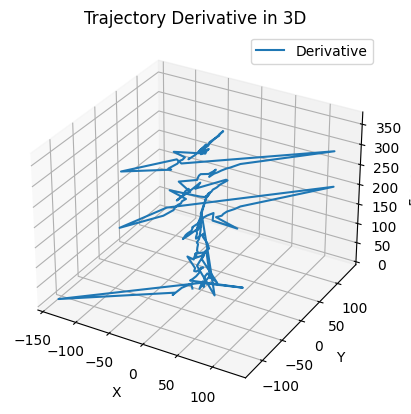

In [8]:
# Calculate the derivatives of x and y
derivative_x = np.gradient(new_x, frame_numbers)
derivative_y = np.gradient(new_y, frame_numbers)

# Plotting
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(derivative_x, derivative_y, frame_numbers, label='Derivative')

# Labeling axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Frame')

plt.title('Trajectory Derivative in 3D')
plt.legend()
plt.show()

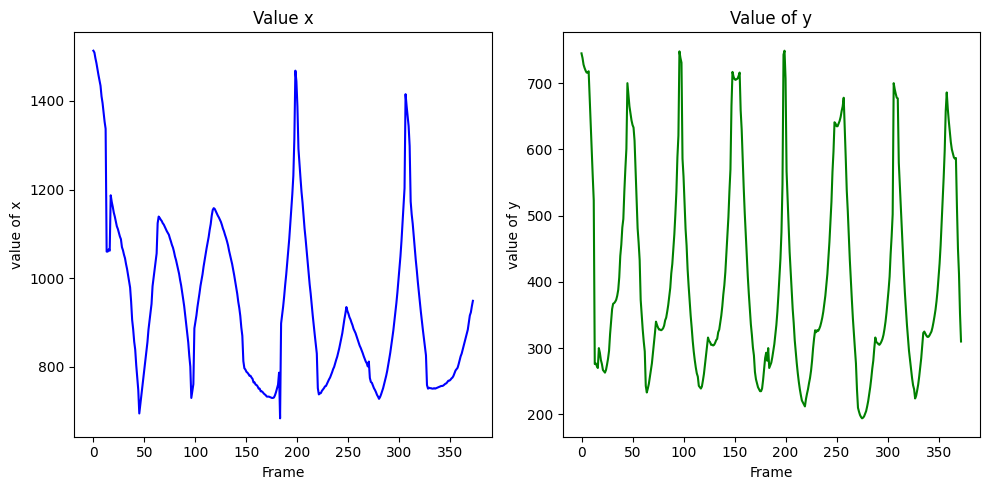

In [9]:
# Plotting the derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot derivative of x
plt.subplot(1, 2, 1)
plt.plot(frame_numbers, x, label='Derivative of x', color='blue')
plt.xlabel('Frame')
plt.ylabel('value of x')
plt.title('Value x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.plot(frame_numbers, y, label='Derivative of y', color='green')
plt.xlabel('Frame')
plt.ylabel('value of y')
plt.title('Value of y')

plt.tight_layout()
plt.show()

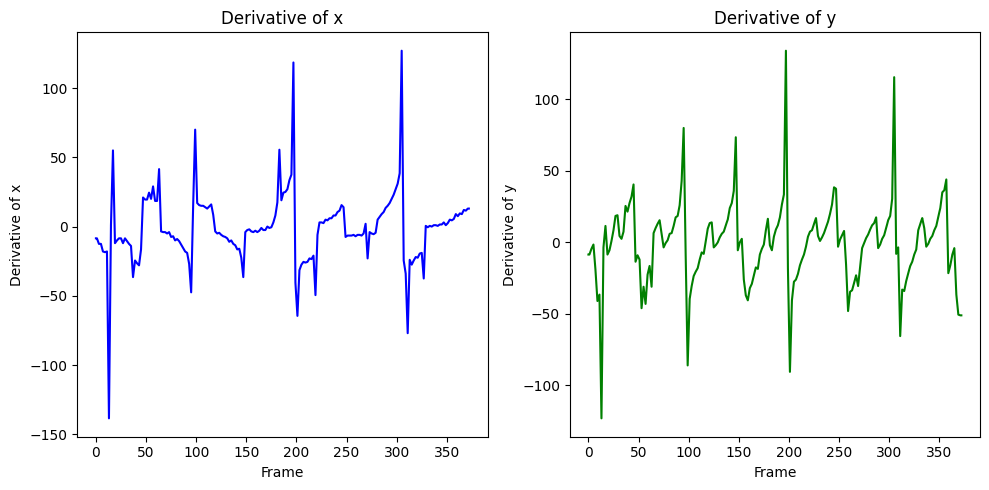

In [10]:
# Plotting the derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot derivative of x
plt.subplot(1, 2, 1)
plt.plot(frame_numbers, derivative_x, label='Derivative of x', color='blue')
plt.xlabel('Frame')
plt.ylabel('Derivative of x')
plt.title('Derivative of x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.plot(frame_numbers, derivative_y, label='Derivative of y', color='green')
plt.xlabel('Frame')
plt.ylabel('Derivative of y')
plt.title('Derivative of y')

plt.tight_layout()
plt.show()

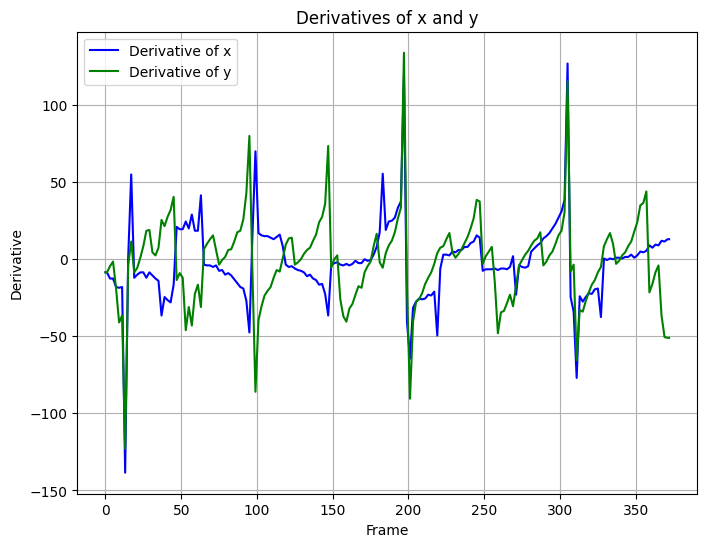

In [11]:
# Plotting both derivatives on the same graph
plt.figure(figsize=(8, 6))

# Plot derivative of x
plt.plot(frame_numbers, derivative_x, label='Derivative of x', color='blue')

# Plot derivative of y
plt.plot(frame_numbers, derivative_y, label='Derivative of y', color='green')

plt.xlabel('Frame')
plt.ylabel('Derivative')
plt.title('Derivatives of x and y')
plt.legend()
plt.grid(True)
plt.show()

In [12]:
# Calculate the second derivatives of x and y
second_derivative_x = np.gradient(derivative_x, frame_numbers)
second_derivative_y = np.gradient(derivative_y, frame_numbers)

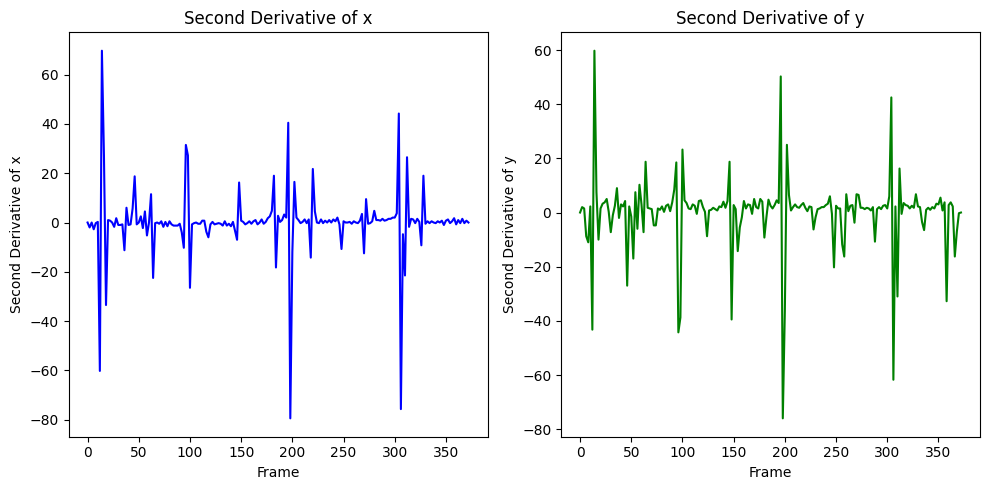

In [13]:
# Plotting the second derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot second derivative of x
plt.subplot(1, 2, 1)
plt.plot(frame_numbers, second_derivative_x, label='Second Derivative of x', color='blue')
plt.xlabel('Frame')
plt.ylabel('Second Derivative of x')
plt.title('Second Derivative of x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.plot(frame_numbers, second_derivative_y, label='Second Derivative of y', color='green')
plt.xlabel('Frame')
plt.ylabel('Second Derivative of y')
plt.title('Second Derivative of y')

plt.tight_layout()
plt.show()

In [14]:
# Find points of inflection (where the second derivative changes sign)
inflection_points_x = frame_numbers[np.where(np.diff(np.sign(second_derivative_x)))[0]]
inflection_points_y = frame_numbers[np.where(np.diff(np.sign(second_derivative_y)))[0]]

print("Points of inflection for x:")
for frame in inflection_points_x:
    print(f"Frame: {frame:.2f}, x: {f_x(frame):.2f}, y: {f_y(frame):.2f}")

print("\nPoints of inflection for y:")
for frame in inflection_points_y:
    print(f"Frame: {frame:.2f}, x: {f_x(frame):.2f}, y: {f_y(frame):.2f}")


Points of inflection for x:
Frame: 0.00, x: 1513.00, y: 745.00
Frame: 3.00, x: 1483.50, y: 723.50
Frame: 4.00, x: 1471.00, y: 719.00
Frame: 8.00, x: 1410.00, y: 678.00
Frame: 9.00, x: 1391.50, y: 637.00
Frame: 10.00, x: 1373.00, y: 596.00
Frame: 12.00, x: 1337.00, y: 523.00
Frame: 16.00, x: 1062.00, y: 270.00
Frame: 19.00, x: 1160.00, y: 284.50
Frame: 23.00, x: 1119.50, y: 266.00
Frame: 24.00, x: 1111.00, y: 267.00
Frame: 26.00, x: 1094.00, y: 284.00
Frame: 27.00, x: 1082.00, y: 302.50
Frame: 29.00, x: 1061.50, y: 340.00
Frame: 37.00, x: 942.50, y: 413.50
Frame: 39.00, x: 881.50, y: 460.50
Frame: 42.00, x: 804.00, y: 537.00
Frame: 47.00, x: 736.00, y: 668.50
Frame: 49.00, x: 776.50, y: 646.00
Frame: 50.00, x: 796.00, y: 637.00
Frame: 53.00, x: 859.50, y: 567.00
Frame: 54.00, x: 884.00, y: 521.00
Frame: 56.00, x: 924.00, y: 459.00
Frame: 59.00, x: 1000.50, y: 350.50
Frame: 60.00, x: 1019.00, y: 328.00
Frame: 62.00, x: 1056.00, y: 295.00
Frame: 67.00, x: 1128.00, y: 256.00
Frame: 68.00, 

In [15]:
# Find inflection points with the same frame for both x and y
same_frame_points = [frame for frame in inflection_points_x if frame in inflection_points_y]

# Find inflection points with different frames for x and y
diff_frame_points_x = [frame for frame in inflection_points_x if frame not in inflection_points_y]
diff_frame_points_y = [frame for frame in inflection_points_y if frame not in inflection_points_x]

print("Inflection points with the same frame for both x and y:", same_frame_points)
print("Inflection points with different frames for x:", diff_frame_points_x)
print("Inflection points with different frames for y:", diff_frame_points_y)

Inflection points with the same frame for both x and y: [0, 4, 9, 10, 12, 16, 19, 37, 47, 49, 53, 56, 60, 62, 70, 75, 94, 99, 114, 122, 146, 152, 158, 167, 168, 196, 226, 245, 249, 254, 259, 268, 304, 313, 337, 359, 364, 371]
Inflection points with different frames for x: [3, 8, 23, 24, 26, 27, 29, 39, 42, 50, 54, 59, 67, 68, 71, 72, 76, 79, 80, 105, 106, 110, 121, 133, 134, 141, 142, 156, 159, 160, 161, 165, 171, 173, 183, 185, 200, 207, 208, 209, 213, 214, 216, 218, 223, 224, 229, 230, 233, 234, 237, 238, 251, 256, 258, 261, 262, 264, 271, 273, 276, 310, 315, 319, 320, 324, 326, 329, 330, 331, 333, 334, 338, 340, 343, 344, 346, 349, 353, 354, 360, 363, 367, 368]
Inflection points with different frames for y: [28, 32, 38, 44, 55, 113, 125, 149, 178, 182, 201, 231, 266, 286, 289, 307, 308, 311, 314, 332, 356]


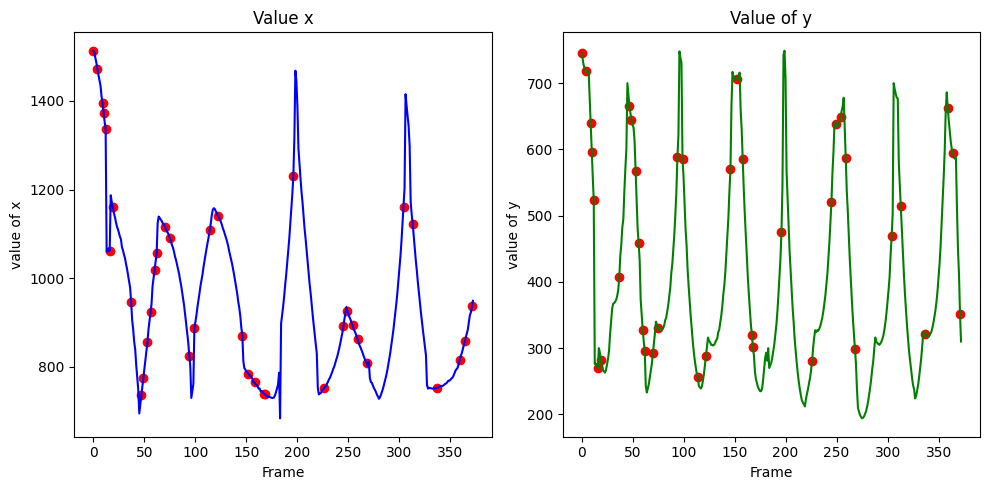

In [16]:
# Plotting the derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot derivative of x
plt.subplot(1, 2, 1)
plt.plot(frame_numbers, x, label='Derivative of x', color='blue')
plt.scatter(same_frame_points, x[same_frame_points], color='red', label='Same Frame Points')
plt.xlabel('Frame')
plt.ylabel('value of x')
plt.title('Value x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.plot(frame_numbers, y, label='Derivative of y', color='green')
plt.scatter(same_frame_points, y[same_frame_points], color='red', label='Same Frame Points')
plt.xlabel('Frame')
plt.ylabel('value of y')
plt.title('Value of y')

plt.tight_layout()
plt.show()

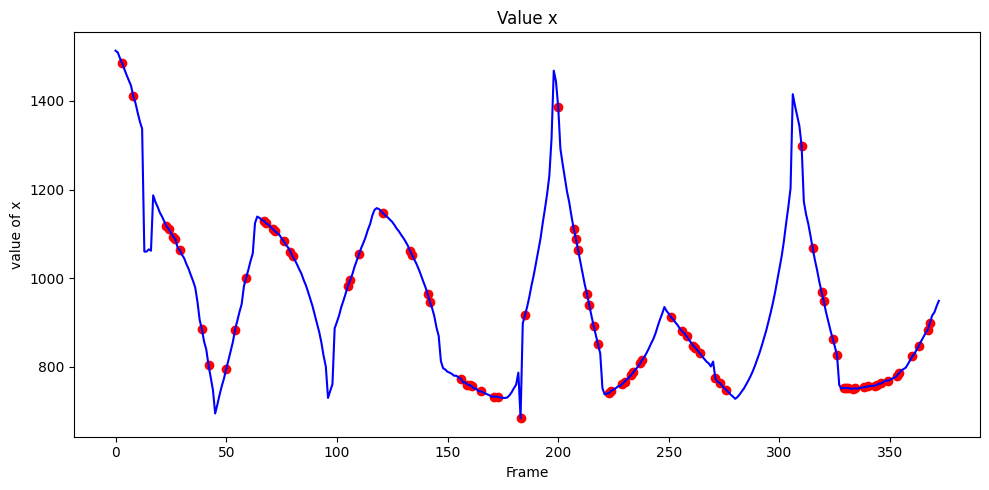

In [17]:
# Plotting the derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

plt.plot(frame_numbers, x, label='Derivative of x', color='blue')
plt.scatter(diff_frame_points_x, x[diff_frame_points_x], color='red', label='Same Frame Points')
plt.xlabel('Frame')
plt.ylabel('value of x')
plt.title('Value x')

plt.tight_layout()
plt.show()

# Looking into the results by frame

In [62]:
import cv2
from google.colab.patches import cv2_imshow

def show_specific_frame(video_path, frame_number):
  """Opens a video and displays a specific frame.

  Args:
    video_path: Path to the video file.
    frame_number: The index of the frame to display (starting from 0).
  """

  # Open the video file
  cap = cv2.VideoCapture(video_path)

  # Check if the video file was opened successfully
  if not cap.isOpened():
    print("Error opening video file")
    return

  # Set the desired frame position
  cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)

  # Read the frame
  ret, frame = cap.read()

  if not ret:
    print("Error reading frame")
    return


  frame = cv2.resize(frame, (928, 522))

  # Display the frame
  cv2_imshow(frame)
  cv2.waitKey(0)

  # Release the video capture object
  cap.release()
  cv2.destroyAllWindows()

# Example usage:
video_path = "VideoInput/INPUT_play_5.mp4"  # Replace with your video path

In [19]:
for frame in same_frame_points:
  show_specific_frame(video_path, frame)

Output hidden; open in https://colab.research.google.com to view.

We can see that these results don't show to much regarding the peaks, let's first deal with the missing coordinate values in order to try creating a better bounce identificator

# Completing the missing data

In [45]:
coordenada_x = [q[i][0] if q[i] is not None else np.NaN for i in range(len(q))]
coordenada_y = [q[i][1] if q[i] is not None else np.NaN for i in range(len(q))]

In [46]:
coordenada_x = np.array(coordenada_x)
coordenada_y = np.array(coordenada_y)

In [47]:
# prompt: fill the Nan Values of each array with the linear interpolation between the values

import pandas as pd
# Fill NaN values with linear interpolation
coordenada_x_filled = pd.Series(coordenada_x).interpolate().values.astype(int)
coordenada_y_filled = pd.Series(coordenada_y).interpolate().values.astype(int)

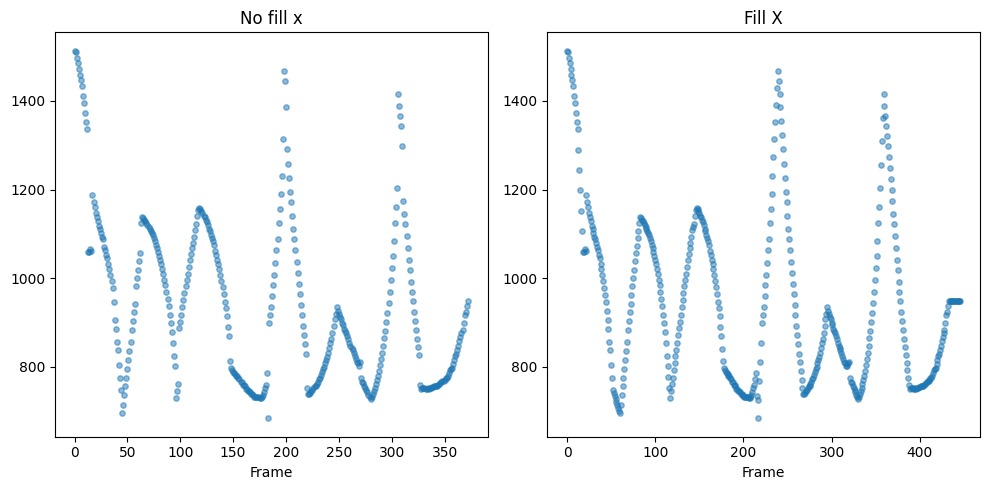

In [49]:
plt.figure(figsize=(10, 5))

# Plot second derivative of x
plt.subplot(1, 2, 1)
plt.scatter(list(range(total_frames_identified)), x_coords, s=15, alpha=0.5)
plt.xlabel('Frame')
plt.title('No fill x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.scatter(list(range(len(coordenada_x))), coordenada_x_filled, s=15, alpha=0.5)
plt.xlabel('Frame')
plt.title('Fill X')

plt.tight_layout()
plt.show()

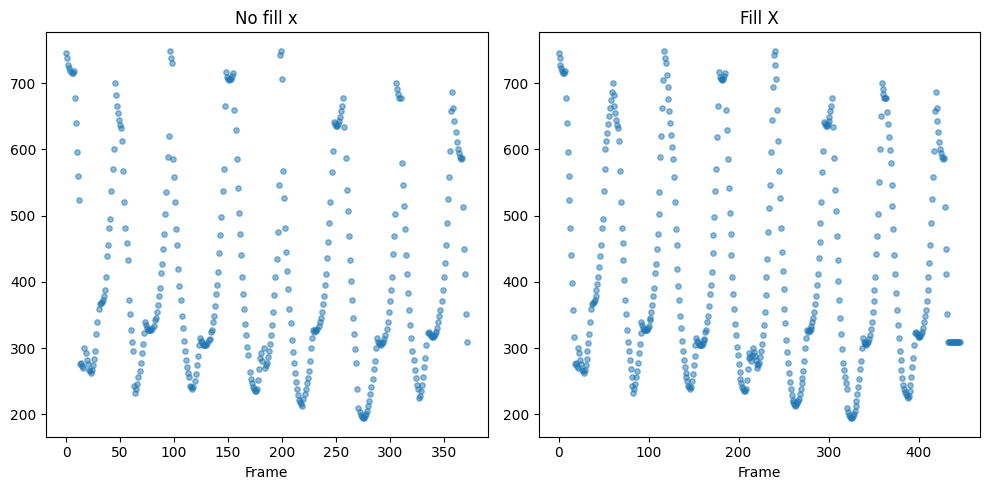

In [50]:
# Plotting the second derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot second derivative of x
plt.subplot(1, 2, 1)
plt.scatter(list(range(total_frames_identified)), y_coords, s=15, alpha=0.5)
plt.xlabel('Frame')
plt.title('No fill x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.scatter(list(range(len(coordenada_x))), coordenada_y_filled, s=15, alpha=0.5)
plt.xlabel('Frame')
plt.title('Fill X')

plt.tight_layout()
plt.show()

We can see that the coordinates make sense, which is good regarding the process

Let's try a different approach on how to identify the peaks in the coordinates, to do that, we will use scipy

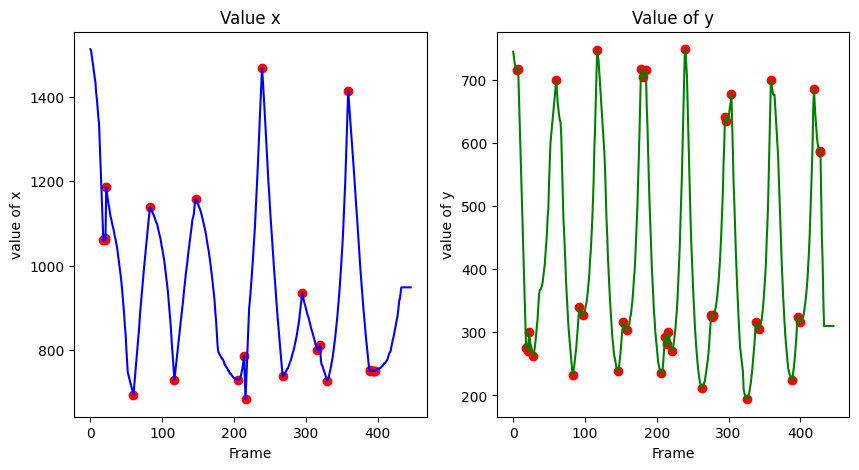

In [52]:
from scipy.signal import find_peaks
peaks_x_up, _ = find_peaks(coordenada_x_filled)
peaks_x_down, _ = find_peaks(-coordenada_x_filled)
peaks_y_up, _ = find_peaks(coordenada_y_filled)
peaks_y_down, _ = find_peaks(-coordenada_y_filled)

peaks_x = np.concatenate((peaks_x_up, peaks_x_down))
peaks_y = np.concatenate((peaks_y_up, peaks_y_down))

# Plotting the derivatives in two separate 2D plots
plt.figure(figsize=(10, 5))

# Plot derivative of x
plt.subplot(1, 2, 1)
plt.plot(coordenada_x_filled, label='X coordinates', color='blue')
plt.scatter(peaks_x, coordenada_x_filled[peaks_x], color='red', label='Same Frame Points')
plt.xlabel('Frame')
plt.ylabel('value of x')
plt.title('Value x')

# Plot derivative of y
plt.subplot(1, 2, 2)
plt.plot(coordenada_y_filled, label='Y coordinates', color='green')
plt.scatter(peaks_y, coordenada_y_filled[peaks_y], color='red', label='Same Frame Points')
plt.xlabel('Frame')
plt.ylabel('value of y')
plt.title('Value of y')

plt.show()

In [55]:
peaks_x

array([ 20,  22,  83, 147, 214, 239, 295, 320, 359, 390, 395,  18,  21,
        60, 117, 206, 216, 268, 316, 330, 389, 393, 396])

In [54]:
peaks_y

array([  7,  19,  22,  60,  92, 117, 153, 178, 185, 212, 216, 240, 276,
       278, 295, 304, 338, 359, 397, 419, 428,   5,  18,  21,  28,  83,
        97, 146, 158, 181, 206, 214, 221, 263, 277, 279, 297, 325, 342,
       388, 400, 427])

In [68]:
peaks_in_common = np.intersect1d(peaks_x, peaks_y)
peaks_in_common

[18, 21, 22, 60, 83, 117, 206, 214, 216, 295, 359]

In [69]:
for frame in peaks_in_common:
  print(f"frame number: {frame}")
  show_specific_frame(video_path, frame)

Output hidden; open in https://colab.research.google.com to view.

In [70]:
peaks_x_not_commom = np.setdiff1d(peaks_x, peaks_in_common)
peaks_y_not_commom = np.setdiff1d(peaks_y, peaks_in_common)

In [71]:
peaks_x_not_commom

array([ 20, 147, 239, 268, 316, 320, 330, 389, 390, 393, 395, 396])

In [77]:
for frame in peaks_x_not_commom:
  print(f"frame number: {frame}")
  show_specific_frame(video_path, frame)

Output hidden; open in https://colab.research.google.com to view.

frame number: 5


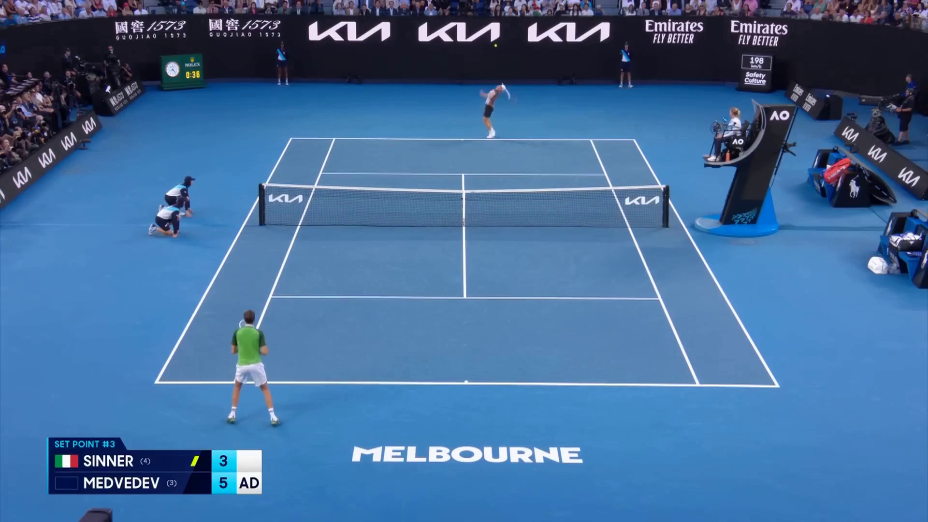

frame number: 7


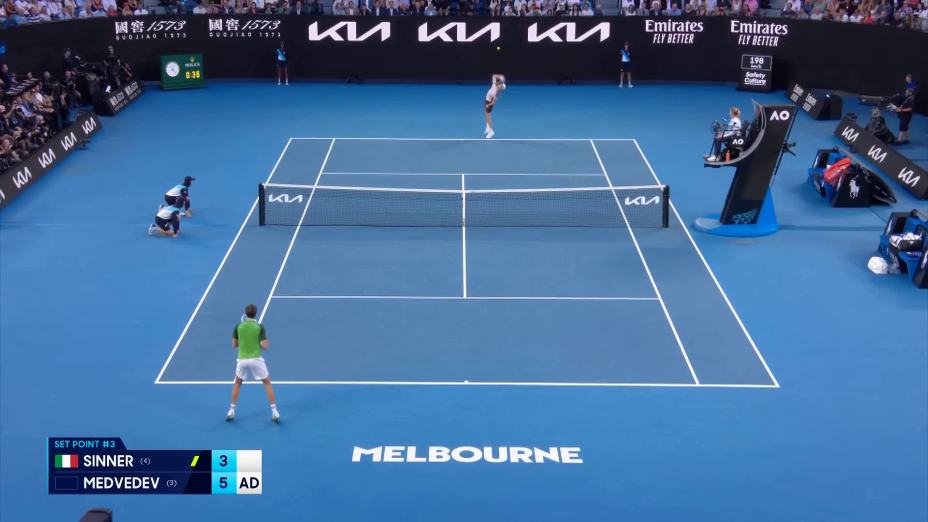

frame number: 19


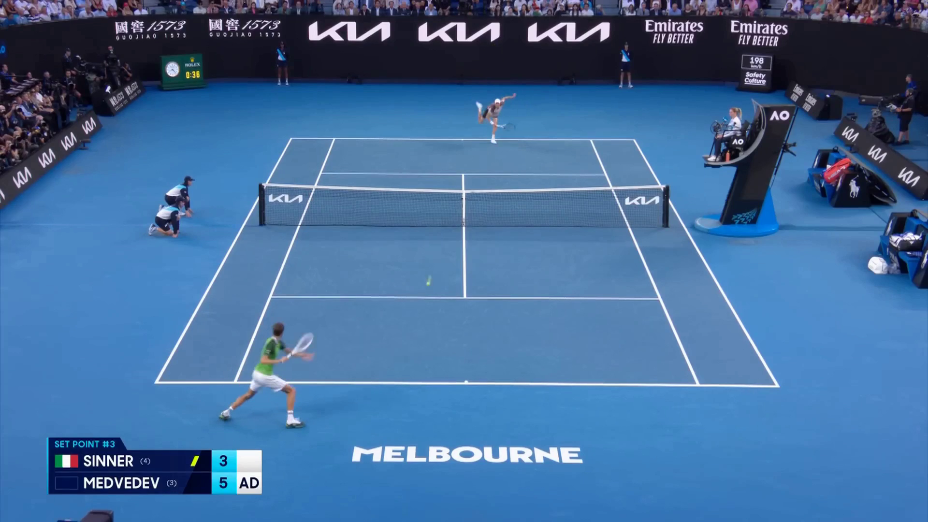

frame number: 28


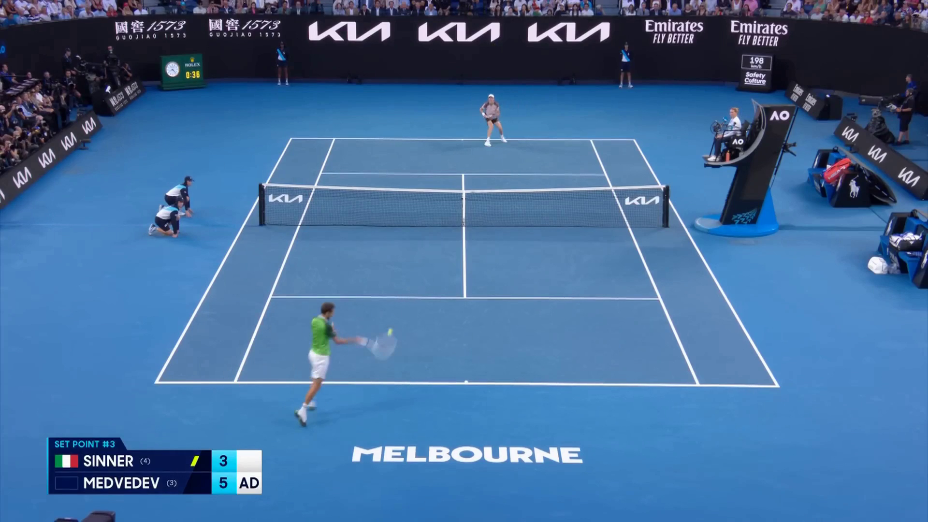

frame number: 92


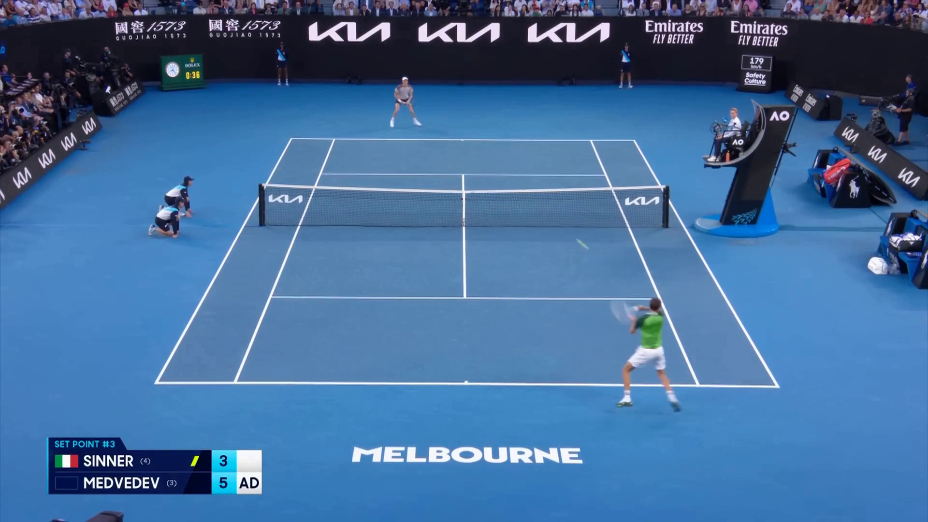

frame number: 97


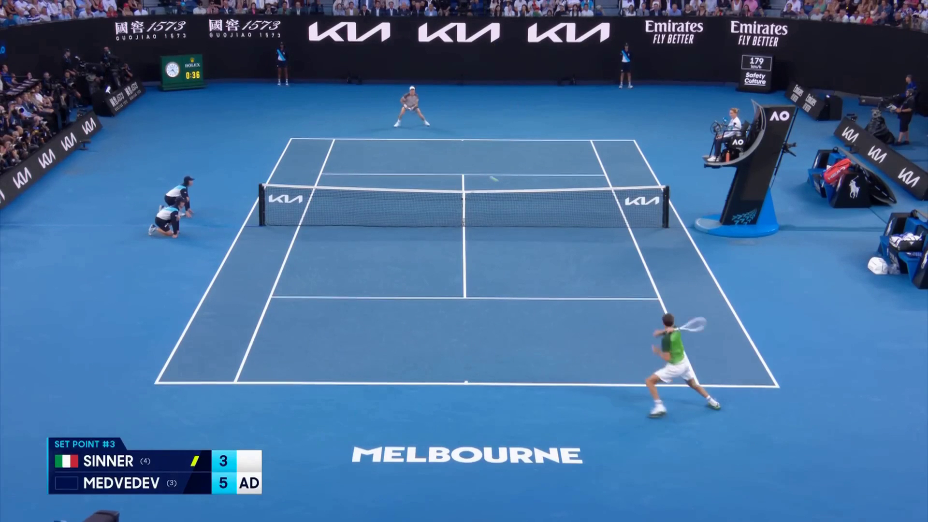

frame number: 146


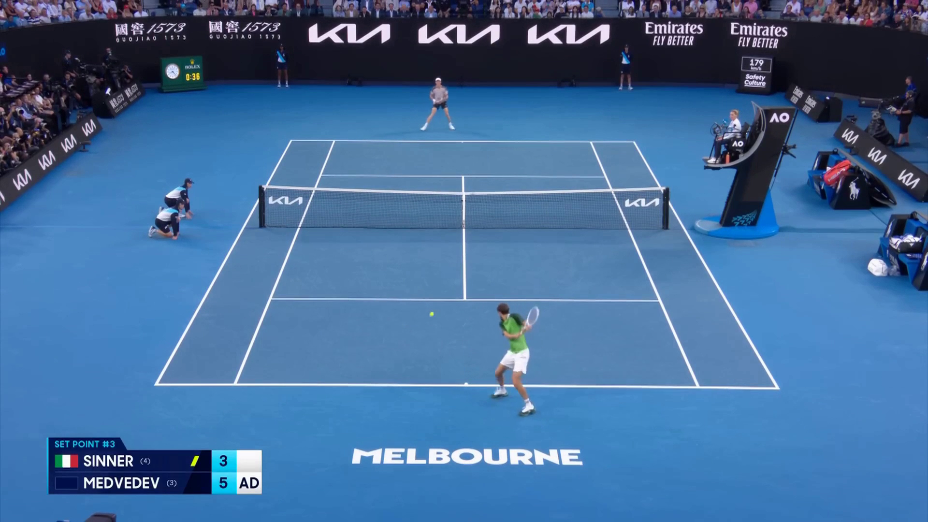

frame number: 153


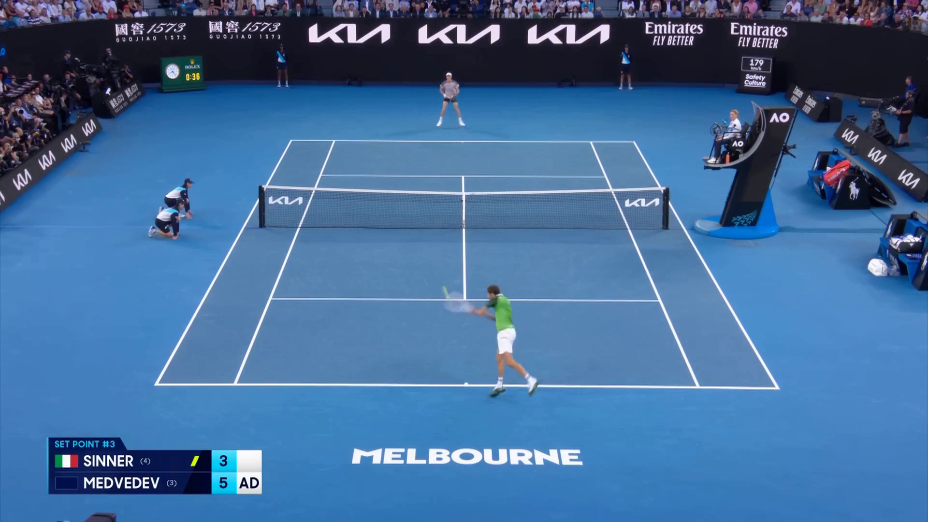

frame number: 158


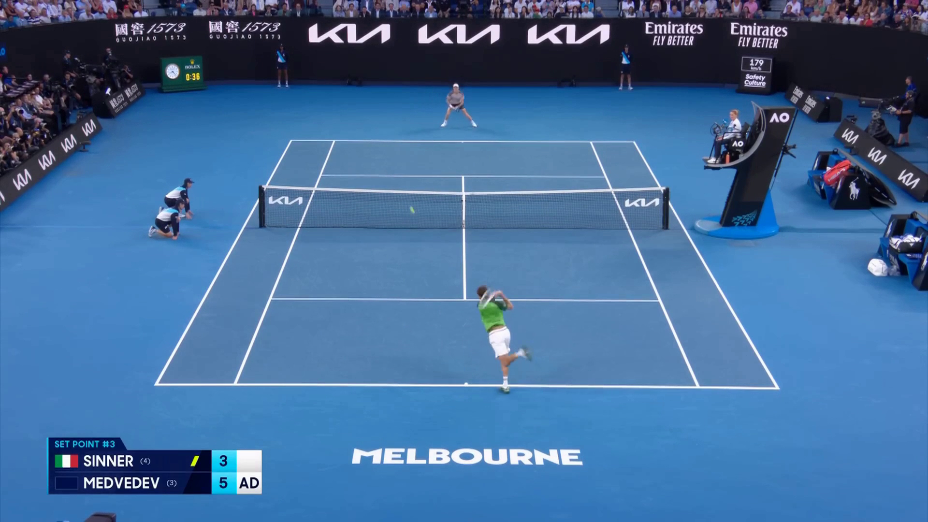

frame number: 178


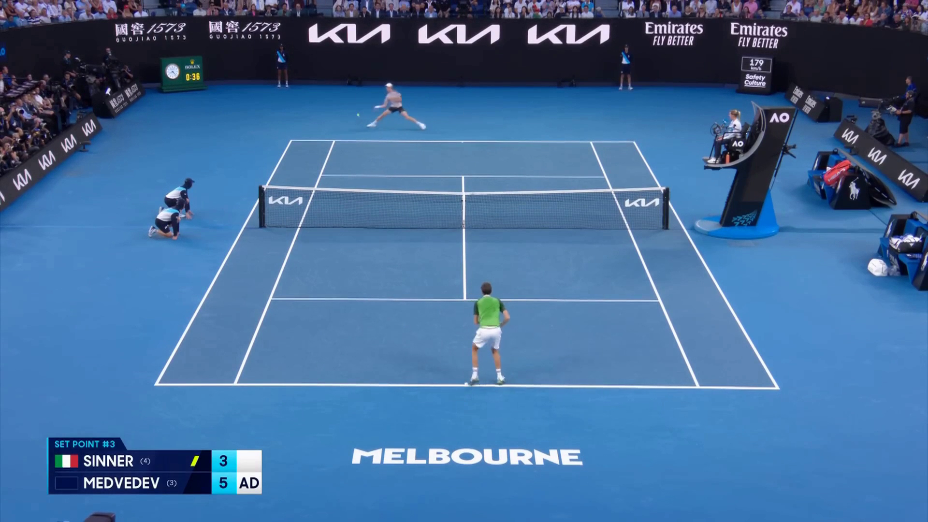

frame number: 181


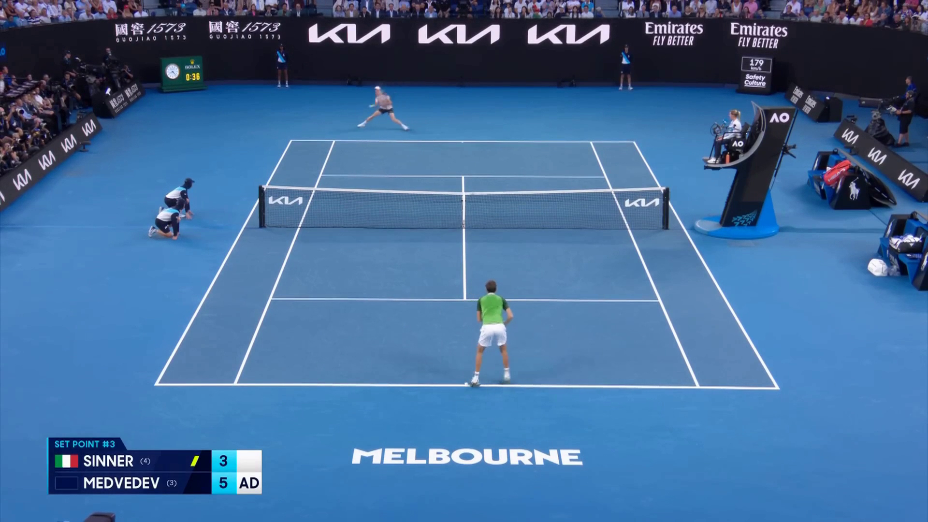

frame number: 185


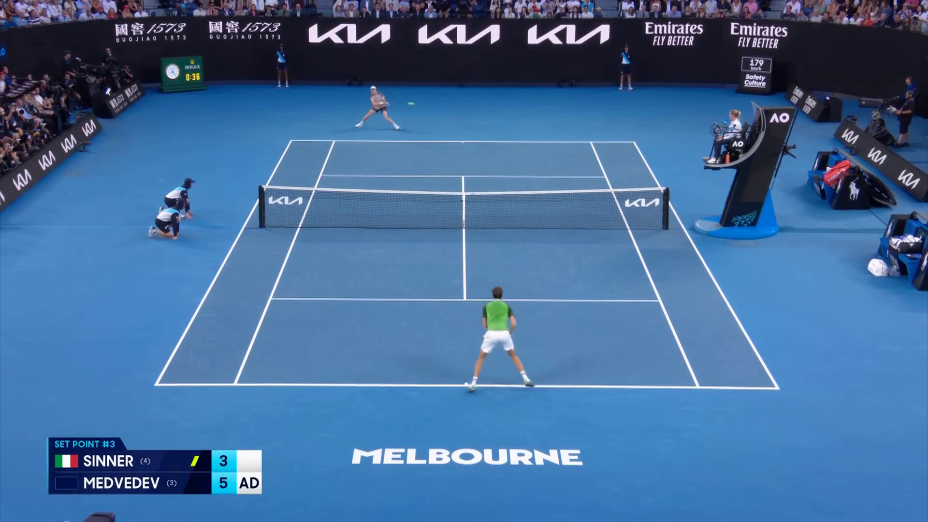

frame number: 212


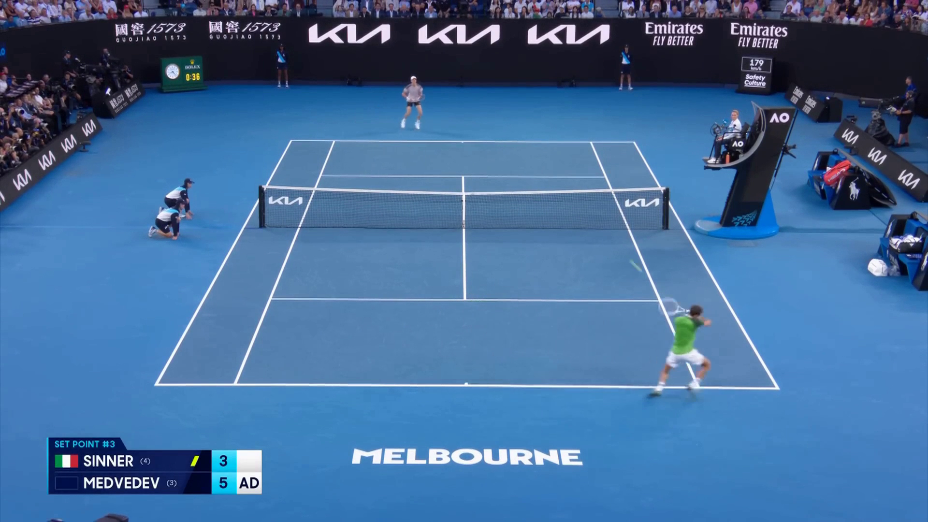

frame number: 221


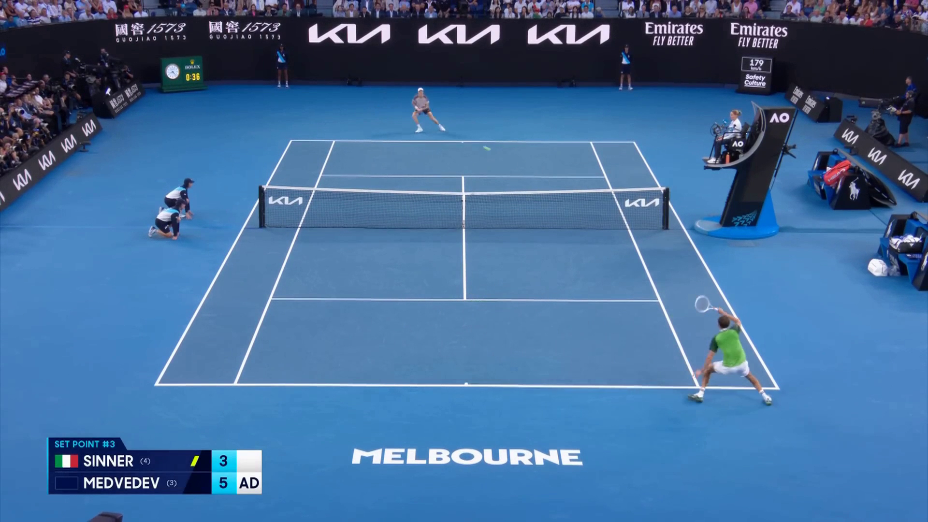

frame number: 240


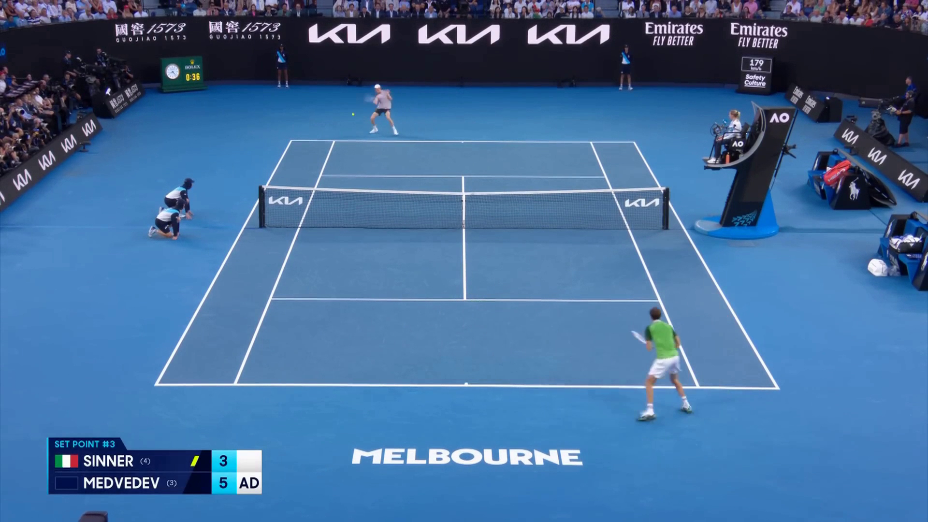

frame number: 263


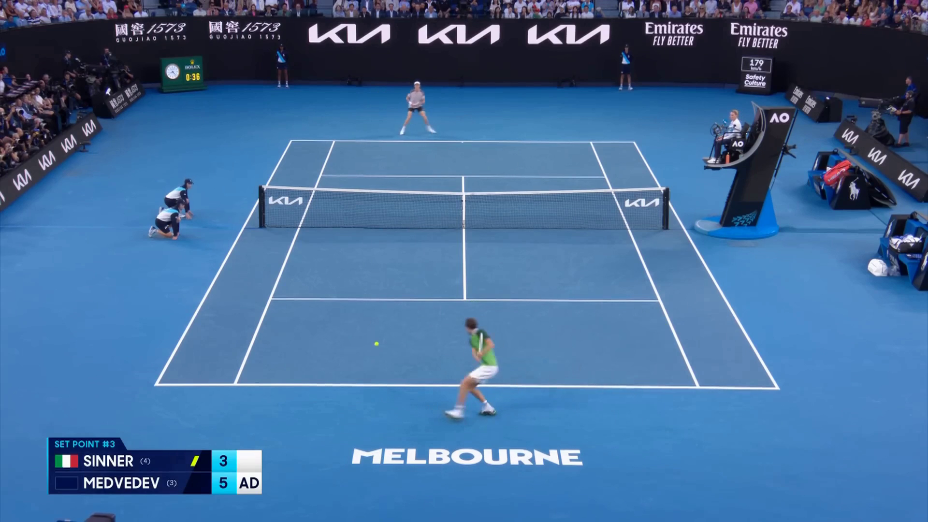

frame number: 276


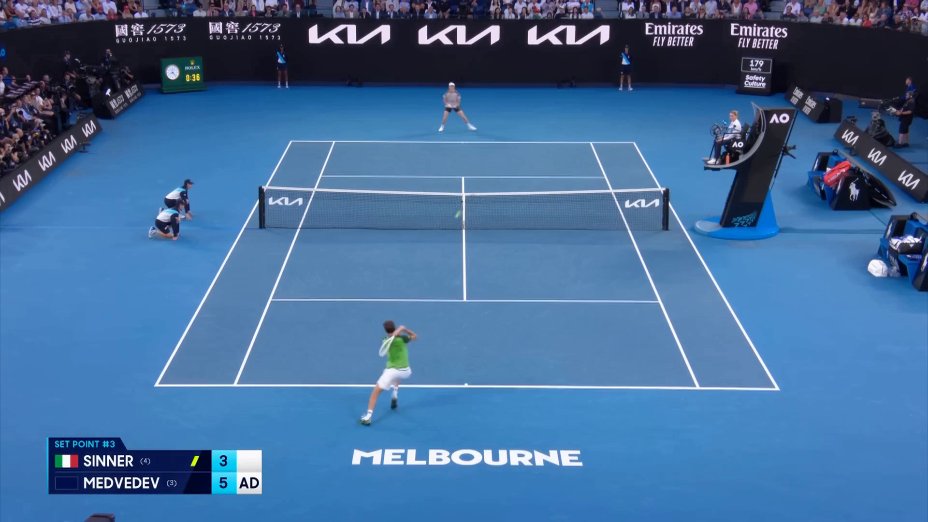

frame number: 277


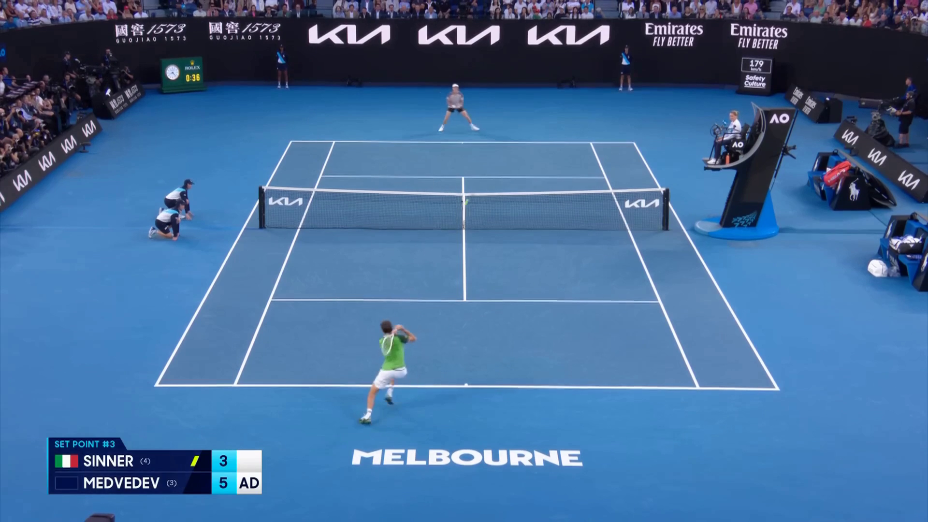

frame number: 278


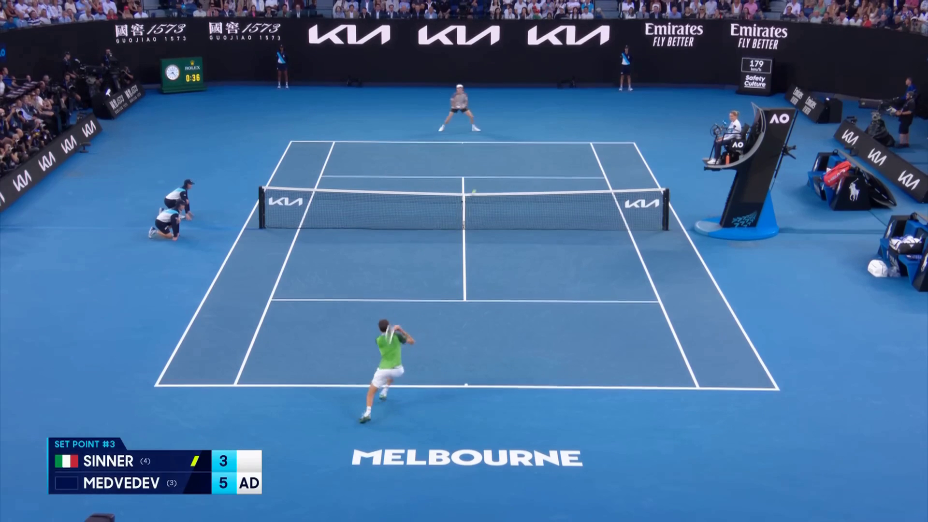

frame number: 279


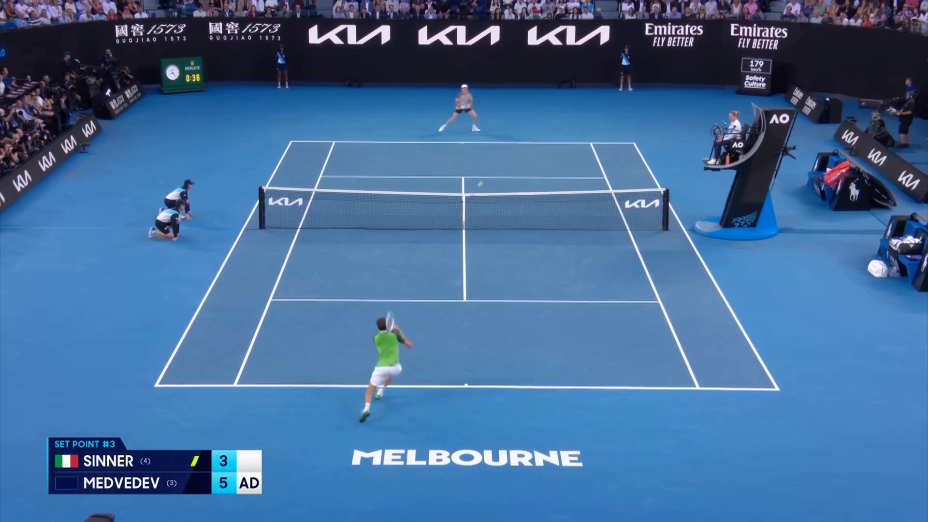

frame number: 297


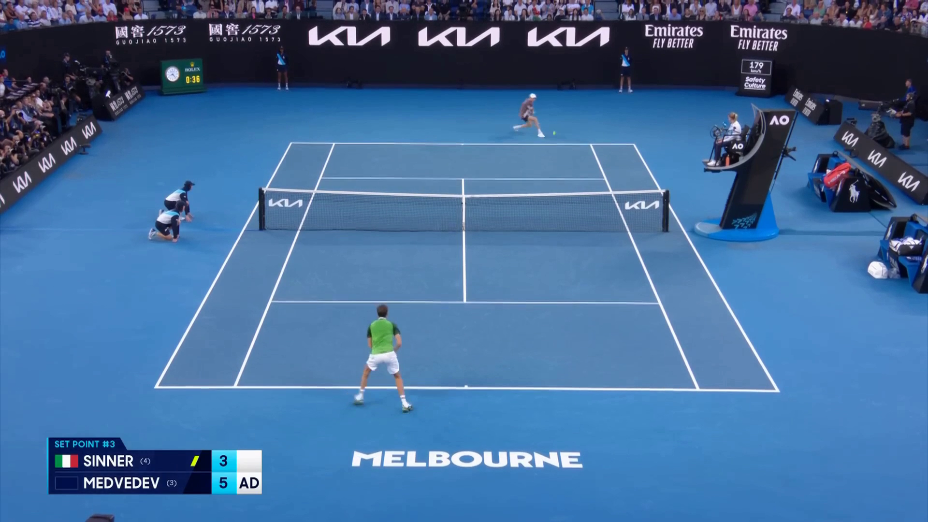

frame number: 304


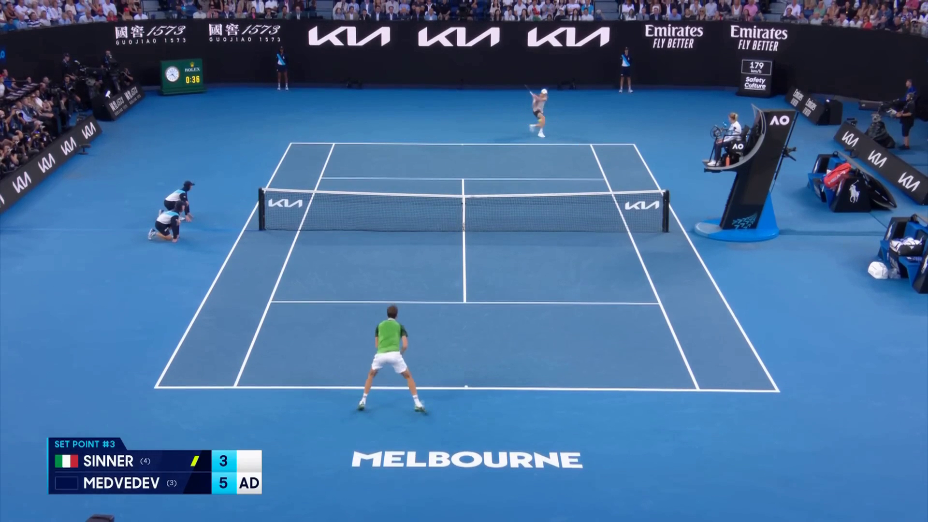

frame number: 325


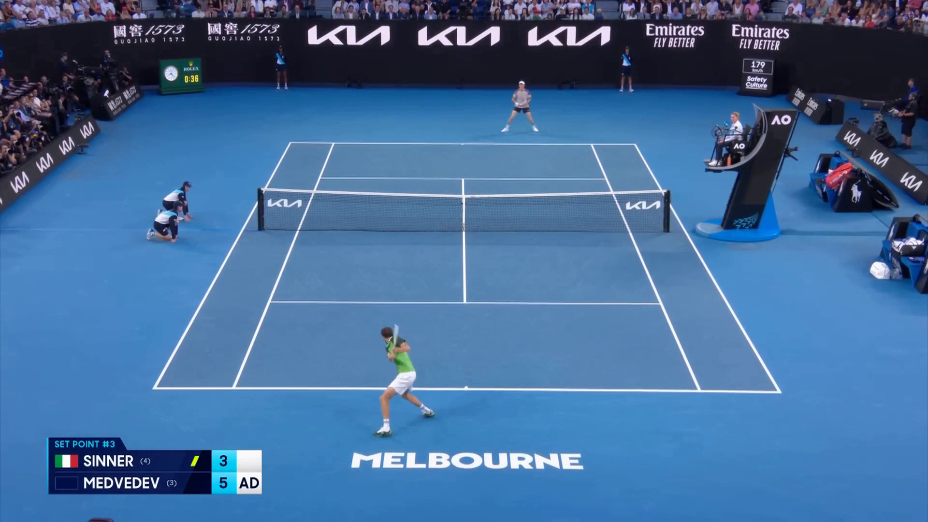

frame number: 338


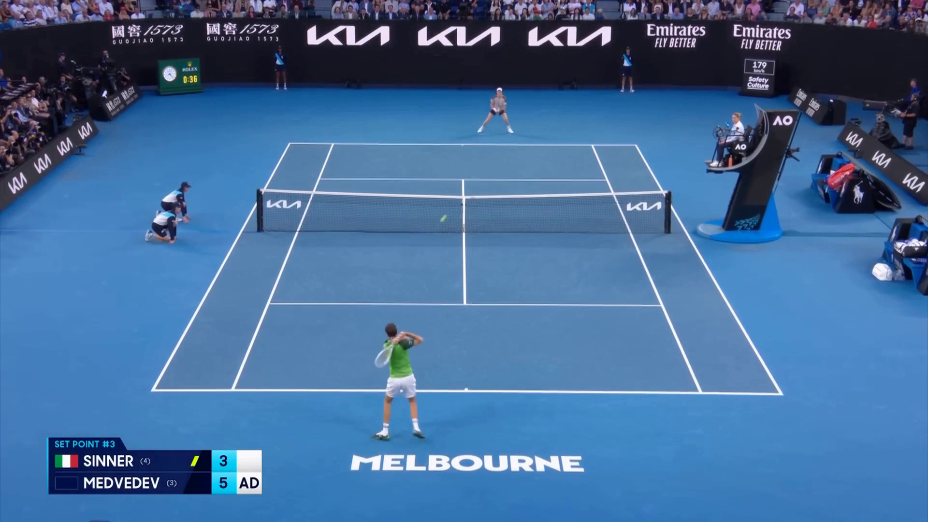

frame number: 342


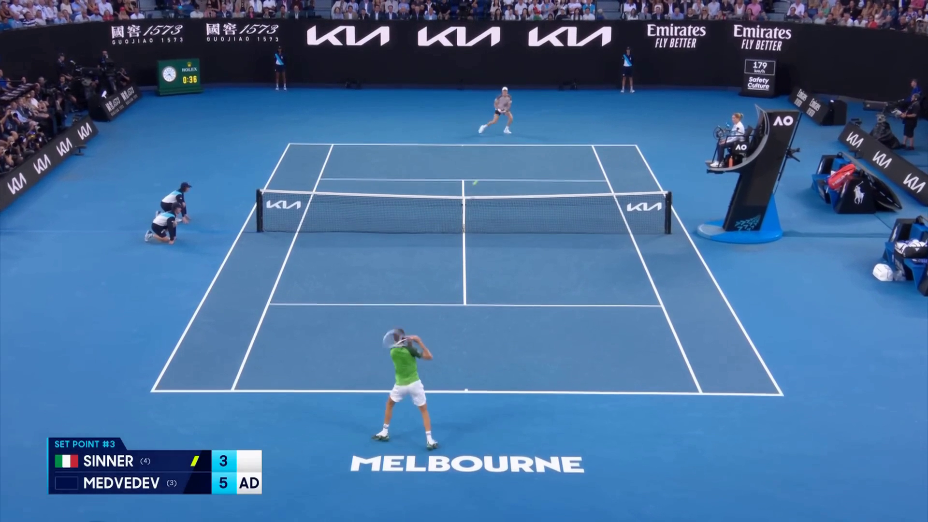

frame number: 388


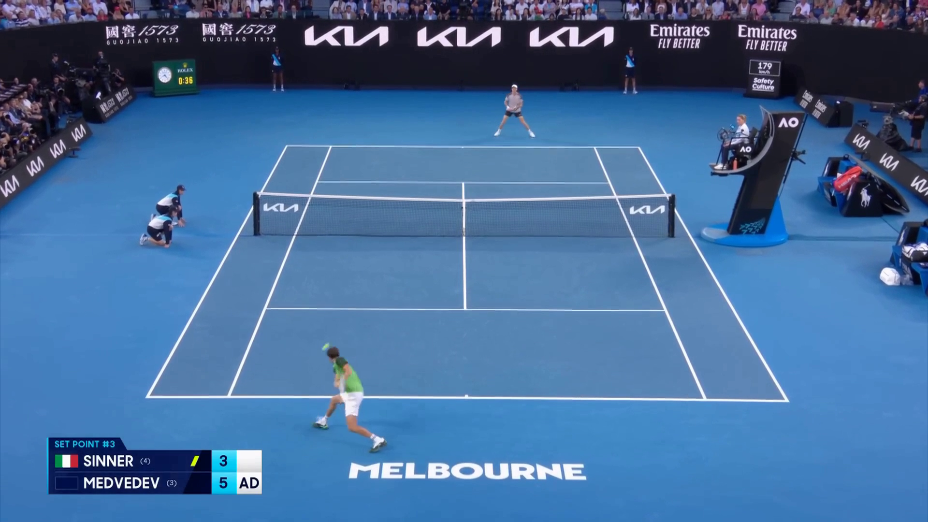

frame number: 397


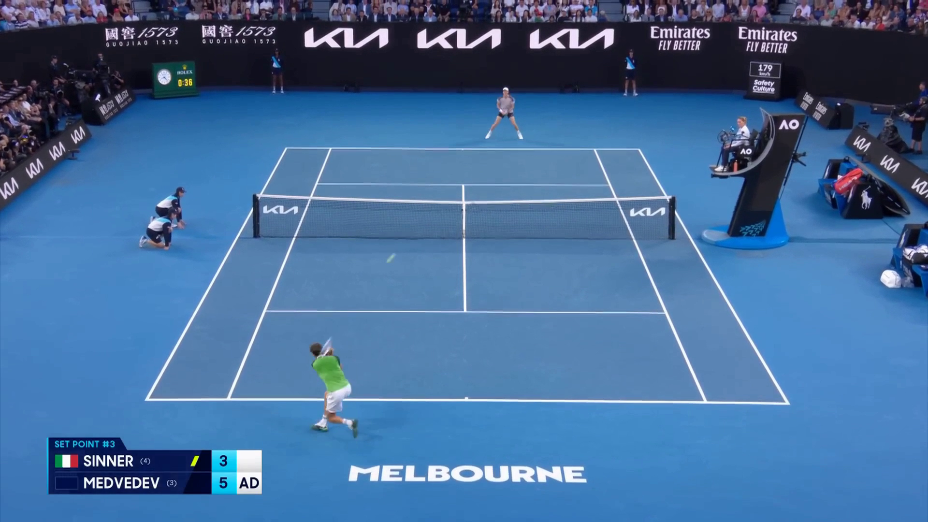

frame number: 400


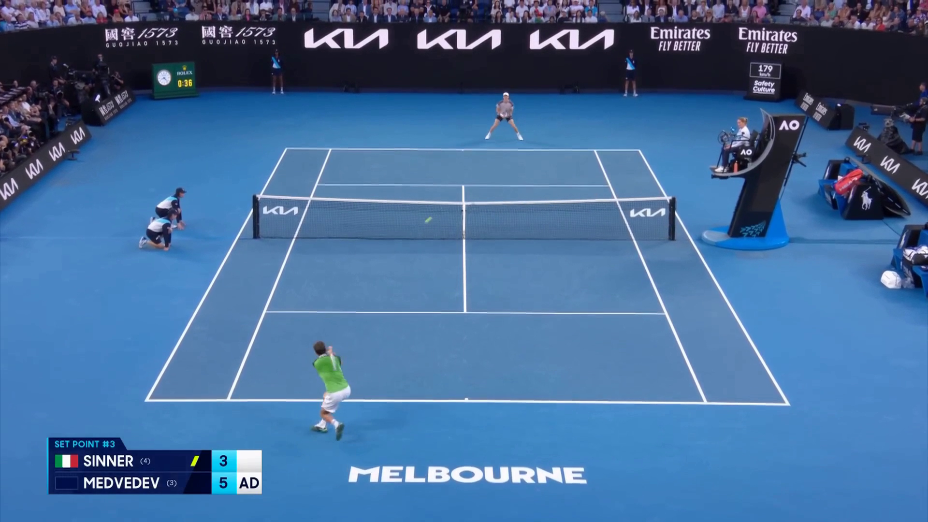

frame number: 419


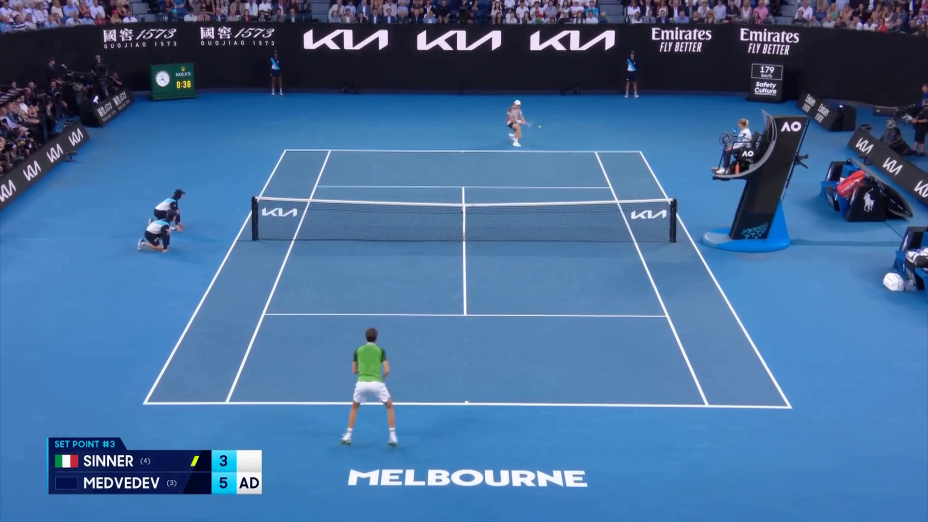

frame number: 427


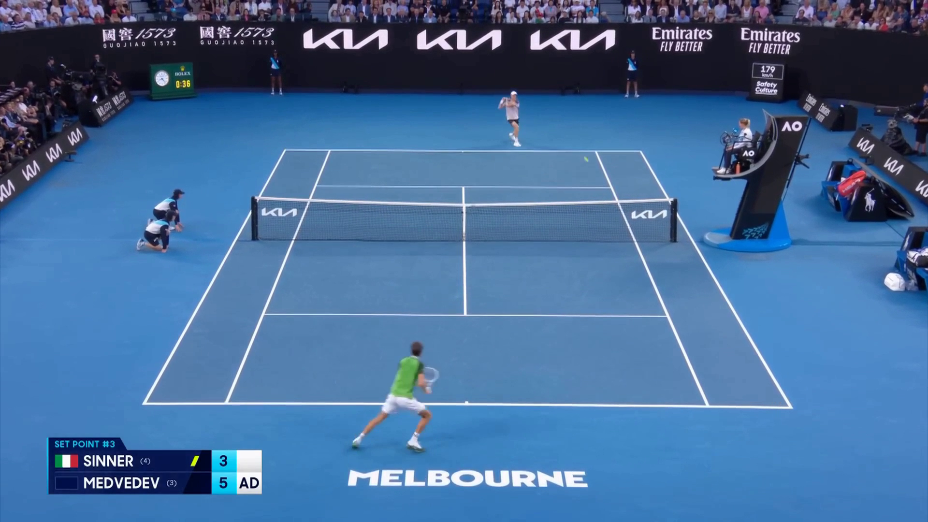

frame number: 428


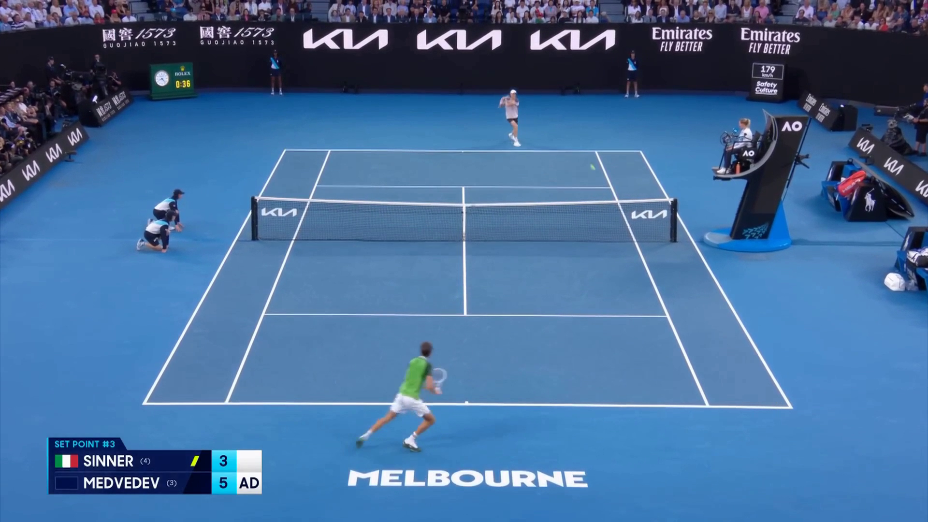

In [78]:
for frame in peaks_y_not_commom:
  print(f"frame number: {frame}")
  show_specific_frame(video_path, frame)